In [1]:
#import necessary libraries

from PIL import Image
from PIL.ExifTags import TAGS, GPSTAGS
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'

from PIL import Image
from io import BytesIO

import matplotlib.pyplot as plt
from IPython.display import display

import plotly.graph_objects as go
import plotly.io as pio

import numpy as np
import matplotlib.pyplot as plt

from kornia.utils import image_to_tensor

from kornia.feature import LoFTR
import torch
from torchvision.transforms import Grayscale
from torchvision.transforms import Resize

In [2]:
#replace with path to the project folder
current_dir = 'e:\\BOSTON UNIVERSITY\\CAS CS 549\\ml-terc-image-geolocation'  
os.chdir(current_dir)

In [3]:
def get_exif_data(image_path):
    """
    Function to extract specific EXIF metadata - GPS coordinates, 
    camera model, and focal length from an image file. 
    --------------------------------------------------------------
    Parameters:
    image_path: A string representing the file path of the image from which the EXIF data is to be extracted.
    --------------------------------------------------------------
    Returns:
    A tuple of lists containing the EXIF tags and their corresponding values.
    """
    desired_tags = ['GPSLatitudeRef', 'GPSLatitude', 'GPSLongitudeRef', 'GPSLongitude', 'GPSAltitude', 'Model', 'FocalLength', "DateTime"]

    image = Image.open(image_path)
    exif_data = image._getexif()
    exif_dict = {}

    if exif_data is not None:
        for key, value in exif_data.items():
            if key in TAGS:
                tag = TAGS[key]

                if tag == 'GPSInfo':
                    gps_data = {}
                    for t in value:
                        sub_tag = GPSTAGS.get(t, t)
                        if sub_tag in desired_tags:
                            gps_data[sub_tag] = value[t]
                    exif_dict.update(gps_data)
                elif tag in desired_tags:
                    exif_dict[tag] = value

    return exif_dict


def get_geo_coord(lat, ref_lat, lon, ref_lon):
    """
    Function to convert EXIF GPS coordinates to decimal format.
    --------------------------------------------------------------
    Parameters:
    lat: A list of tuples containing the GPS latitude coordinates in degrees, minutes, and seconds.
    ref_lat: A string representing the reference direction(N, S) of the GPS latitude coordinates.
    lon: A list of tuples containing the GPS longitude coordinates in degrees, minutes, and seconds.
    ref_lon: A string representing the reference direction(E, W) of the GPS longitude coordinates.
    --------------------------------------------------------------
    Returns:
    A tuple of floats representing the GPS coordinates in decimal format.
    """
    deg, minutes, seconds = lat
    decimal_deg_lat = deg + (minutes / 60.0) + (seconds / 3600.0)

    # Adjusting for the reference direction
    if ref_lat == 'S':
        decimal_deg_lat *= -1

    deg, minutes, seconds = lon
    decimal_deg_lon = deg + (minutes / 60.0) + (seconds / 3600.0)

    # Adjusting for the reference direction
    if ref_lon == 'W':
        decimal_deg_lon *= -1

    return decimal_deg_lat, decimal_deg_lon


def fetch_map_image(lat, lon, zoom, size, mapbox_access_token):
    """
    Function to fetch a static map image using Plotly.
    --------------------------------------------------------------
    Parameters:
    lat (float): Latitude of the location.
    lon (float): Longitude of the location.
    zoom (int): Zoom level of the image.
    size (str): Size of the image in 'widthxheight' format (e.g., '600x400').
    altitude (float, optional): Altitude of the location. Used for marker representation.
    mapbox_access_token (str): Mapbox access token for rendering the map.
    --------------------------------------------------------------
    Returns:
    A static image (PNG) of the location.
    """
    width, height = map(int, size.split('x'))

    # Create a scatter mapbox plot with Plotly
    fig = go.Figure(go.Scattermapbox(
        lat=[lat],
        lon=[lon],
    ))

    # Set the layout of the map
    fig.update_layout(
        mapbox=dict(
            accesstoken=mapbox_access_token,
            center=go.layout.mapbox.Center(lat=lat, lon=lon),
            zoom=zoom,
            style='satellite'
        ),
        width=width,
        height=height,
        margin=dict(l=0, r=0, t=0, b=0),
    )

    # Generate the figure as a PNG byte array
    image_data = pio.to_image(fig, format='png')

    pil_image = Image.open(BytesIO(image_data))

    return pil_image

def to_tensor(image):
    """
    Function to convert a PIL image to a PyTorch tensor.
    --------------------------------------------------------------
    Parameters:
    image: A PIL image object.
    --------------------------------------------------------------
    Returns:
    A PyTorch tensor.
    """
    return image_to_tensor(np.array(image)).float() / 255.0

def to_grayscale(image):
    """
    Function to convert an image to grayscale.
    --------------------------------------------------------------
    Parameters:
    image: A PIL image object.
    --------------------------------------------------------------
    Returns:
    A grayscale PIL image object.
    """
    grayscale_transform = Grayscale(num_output_channels=1)
    return grayscale_transform(image)

def plot_matches(img1, img2, mkpts0, mkpts1):
    """
    Function to plot the matches between two images.
    --------------------------------------------------------------
    Parameters:
    img1: A NumPy array representing the first image.
    img2: A NumPy array representing the second image.
    mkpts0: A NumPy array containing the keypoints of the first image.
    mkpts1: A NumPy array containing the keypoints of the second image.
    --------------------------------------------------------------
    Returns:
    None
    """
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))
    ax.imshow(np.concatenate([img1, img2], axis=1), cmap='gray')
    ax.plot(mkpts0[:, 0], mkpts0[:, 1], 'ro', markersize=2)
    ax.plot(mkpts1[:, 0] + img1.shape[1], mkpts1[:, 1], 'bo', markersize=2)
    for i in range(mkpts0.shape[0]):
        ax.plot([mkpts0[i, 0], mkpts1[i, 0] + img1.shape[1]], [mkpts0[i, 1], mkpts1[i, 1]], 'y-')
    plt.axis('off')
    plt.show()


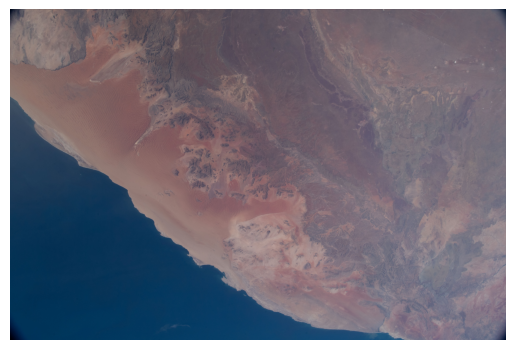

Extracted Metadata:
 {'GPSLatitudeRef': 'S', 'GPSLatitude': (26.0, 27.0, 22.536), 'GPSLongitudeRef': 'E', 'GPSLongitude': (15.0, 12.0, 18.849206349206348), 'GPSAltitude': 426141.8977272727, 'Model': 'NIKON D5', 'DateTime': '2021:05:24 17:41:07', 'FocalLength': 24.0}


In [4]:
#use exif image to get metadata of interest from the image

# query_img_path = "data\\images\\iss036e049939.jpg" # kilimanjaro
# query_img_path = "data\\images\\iss040e092721.jpg" # island img
query_img_path = "data\\images\\iss065e054848.jpg" # other images

query_img = Image.open(query_img_path)
plt.imshow(query_img)
plt.axis('off') 
plt.show()

exif_data = get_exif_data(query_img_path)

print(f"Extracted Metadata:\n {exif_data}")

In [5]:
# Extracting GPS data for conversion
gps_latitude = exif_data.get('GPSLatitude', None)
gps_latitude_ref = exif_data.get('GPSLatitudeRef', None)
gps_longitude = exif_data.get('GPSLongitude', None)
gps_longitude_ref = exif_data.get('GPSLongitudeRef', None)

# Check if all GPS data is available
if gps_latitude and gps_latitude_ref and gps_longitude and gps_longitude_ref:
    lat, long = get_geo_coord(gps_latitude, gps_latitude_ref, gps_longitude, gps_longitude_ref)
    print(f"ISS coordinates: {lat}, {long}")
else:
    print("GPS data is incomplete or not available in the image.")

ISS coordinates: -26.45626, 15.205235890652556


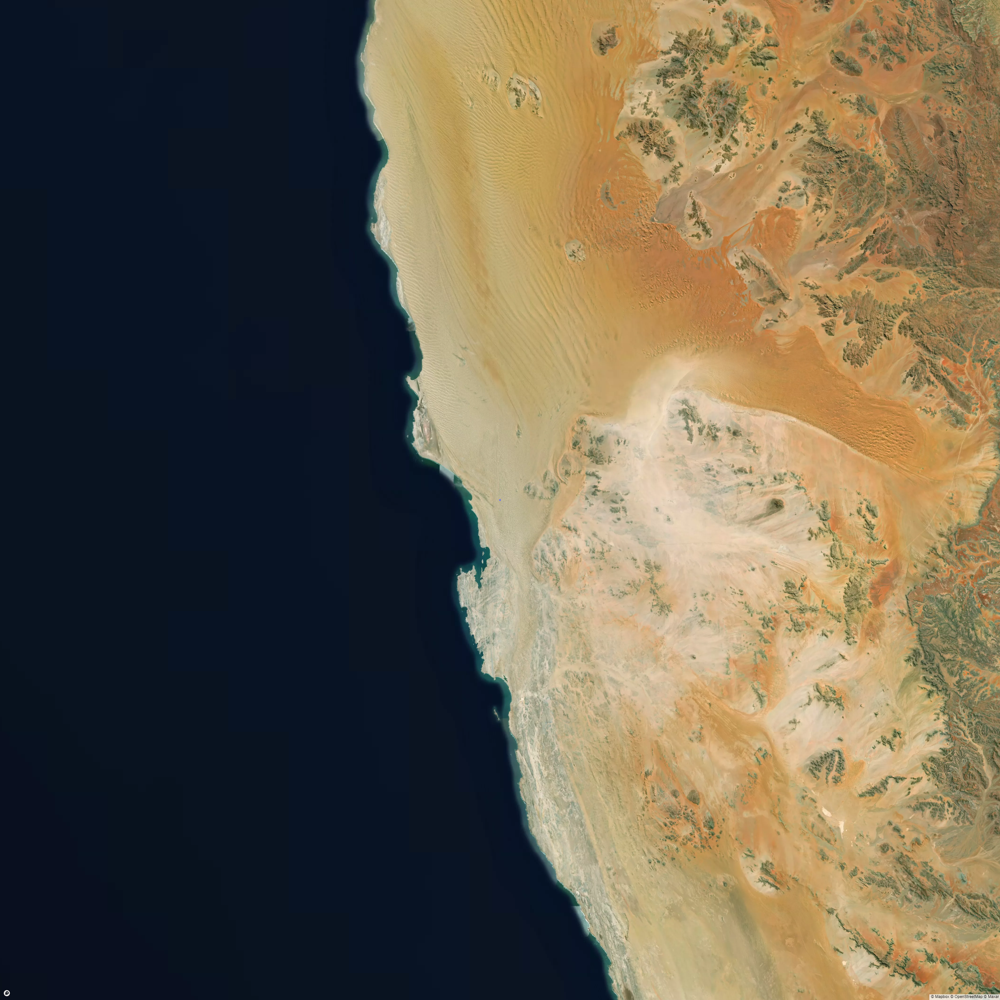

In [6]:
# Get Area of Interest

zoom_level = 9.5
image_size = '3000x3000' 

# replace with own access token
# mapbox_access_token = input('Enter Mapbox Aceess Token: ')
mapbox_access_token ='pk.eyJ1IjoidmVkaWthcyIsImEiOiJjbGlkaHp4ZXgwMnY5M2lsbjhmemJrb2ZmIn0.59ARdGiFpGqIC84dBEORkA'

aoi_img = fetch_map_image(lat, long, zoom_level, image_size, mapbox_access_token)

if aoi_img.mode != 'RGB':
    aoi_img = aoi_img.convert('RGB')
display(aoi_img)

In [7]:
# Initialize the LoFTR matcher with the pre-trained weights
matcher = LoFTR(pretrained='outdoor')
matcher = matcher.eval()

In [8]:
#pre-process images
query_img = to_grayscale(query_img)
aoi_img = to_grayscale(aoi_img)

resize_transform = Resize((512, 512))

tensor_query_img = to_tensor(resize_transform(query_img)).unsqueeze(0)
tensor_aoi_img = to_tensor(resize_transform(aoi_img)).unsqueeze(0)

In [9]:
matcher = matcher.to('cpu')
tensor_query_img = tensor_query_img.to('cpu')
tensor_aoi_img = tensor_aoi_img.to('cpu')

# Perform matching
with torch.no_grad():
    input_dict = {"image0": tensor_query_img, "image1": tensor_aoi_img}
    correspondences = matcher(input_dict)

# Extract keypoints from both images
mkpts0 = correspondences['keypoints0'].cpu().numpy()
mkpts1 = correspondences['keypoints1'].cpu().numpy()
mconf = correspondences['confidence'].cpu().numpy()



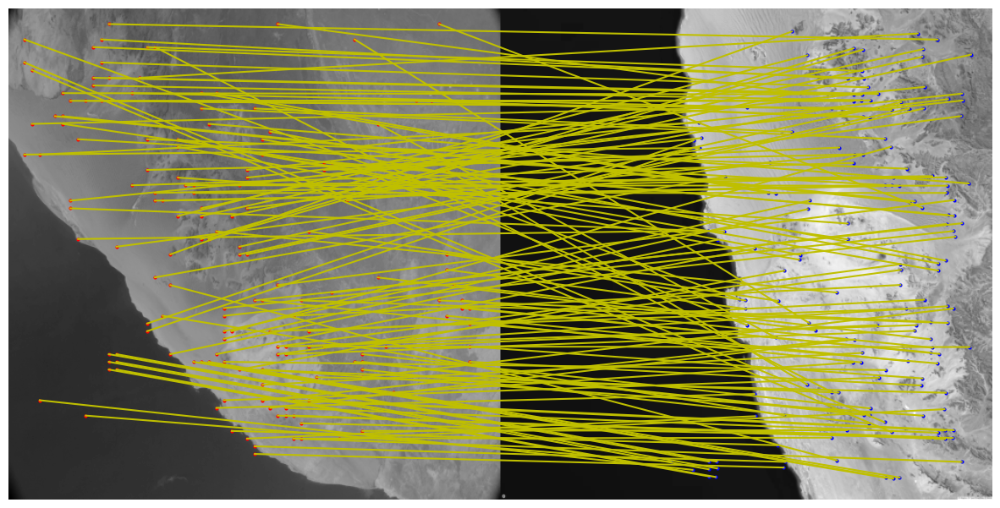

In [10]:
#all matchs
np_query_img = tensor_query_img.squeeze(0).cpu().permute(1, 2, 0).numpy()
np_aoi_img = tensor_aoi_img.squeeze(0).cpu().permute(1, 2, 0).numpy()
plot_matches(np_query_img, np_aoi_img, mkpts0, mkpts1)

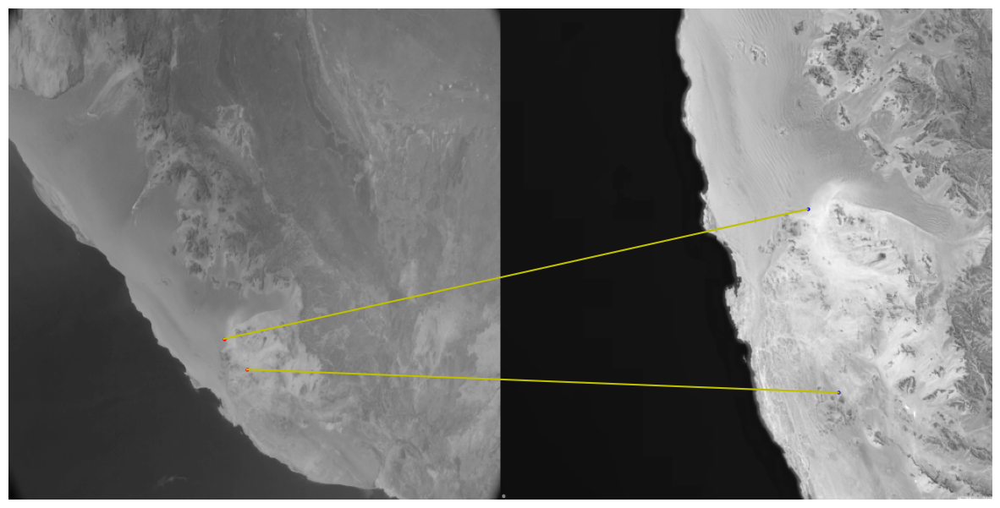

In [12]:
indices = np.argsort(mconf)[::-1][:2]  # Get indices of top x matches

# Select only the top 10 matches
top_mkpts0 = mkpts0[indices]
top_mkpts1 = mkpts1[indices]

np_query_img = tensor_query_img.squeeze(0).cpu().permute(1, 2, 0).numpy()
np_aoi_img = tensor_aoi_img.squeeze(0).cpu().permute(1, 2, 0).numpy()

plot_matches(np_query_img, np_aoi_img, top_mkpts0, top_mkpts1)